In [22]:
import pandas as pd
import geopandas as gpd

import folium
import matplotlib.pyplot as plt
import contextily as ctx

from scipy.stats import chi2_contingency

In [11]:
sensors_974 = pd.read_csv('../20211028_SCOOT_Data/JupyterNotebook_CSV/20211111_real_time_data_OSGB36.csv')[['siteSiteid','originLat','originLong']]
sensors_470 = pd.read_csv('SCOOT/data_470_hourly/locations.csv')

In [33]:
road = gpd.read_file('../Glasgow_road_link-shp/road_link_shp/20211110_glasgow_road_link.shp')
land_cover = gpd.read_file('../Land_cover/Land_cover_shp/land_cover_osgb36.shp')

In [13]:
# Create a GeoDataFrame
def create_gdf(sensors_df):
    
    sensors_df["geometry"] = gpd.points_from_xy(sensors_df["longitude"], sensors_df["latitude"])
    # Set coordinate reference system
    sensors_gdf = gpd.GeoDataFrame(sensors_df, crs="epsg:4326")
    # Reproject
    sensors_gdf = sensors_gdf.to_crs("epsg:27700")
    
    return sensors_gdf

In [20]:
# Change column names
sensors_974.columns = list(sensors_470)
sensors_974 = sensors_974.sort_values(by='id').reset_index(drop=True)

In [23]:
gdf_974 = create_gdf(sensors_974)
gdf_470 = create_gdf(sensors_470)

In [31]:
base_map = gdf_974.explore(color='navy', name='974',tiles='cartodbpositron',width=750, height=500)
# Add another layer using the second GeoDataFrame
gdf_470.explore(m=base_map, color='pink', name='470')

# Add LayerControl to the map, allowing users to toggle between layers
folium.LayerControl().add_to(base_map)
base_map

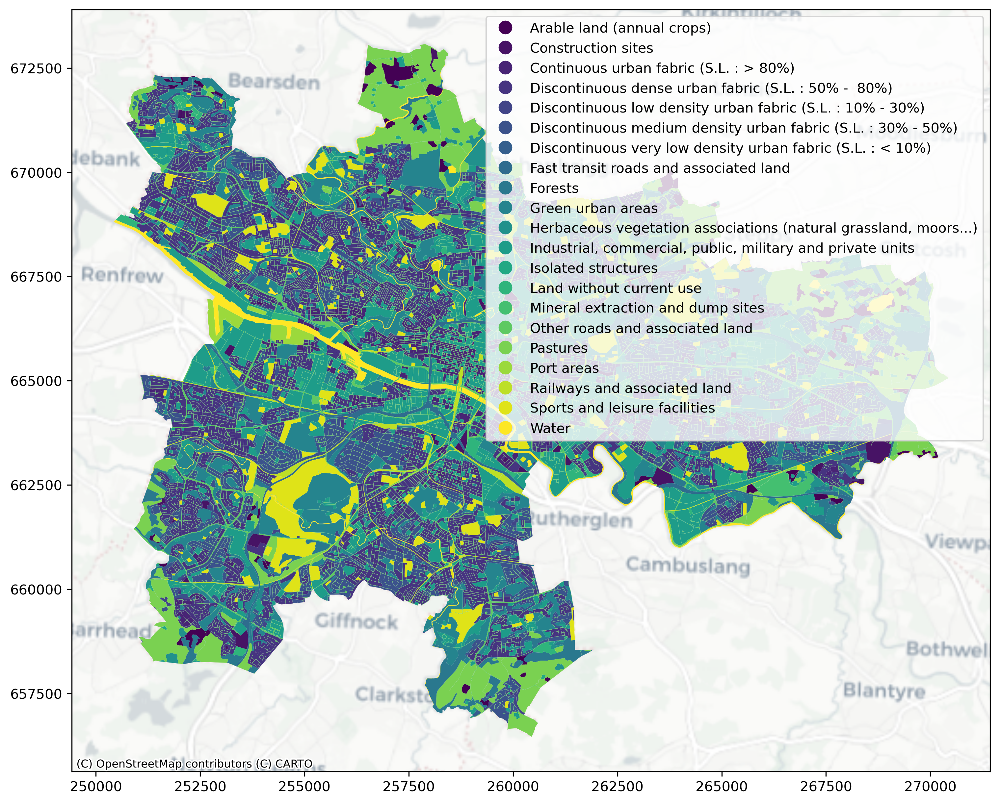

In [44]:
fig, ax = plt.subplots(figsize=(12,24), dpi=300) 
#Plot the data
land_cover.plot(column='class_2018', cmap='viridis', legend=True, ax=ax)
#Add basemap
ctx.add_basemap(ax, crs="EPSG:27700", source=ctx.providers.CartoDB.Positron)

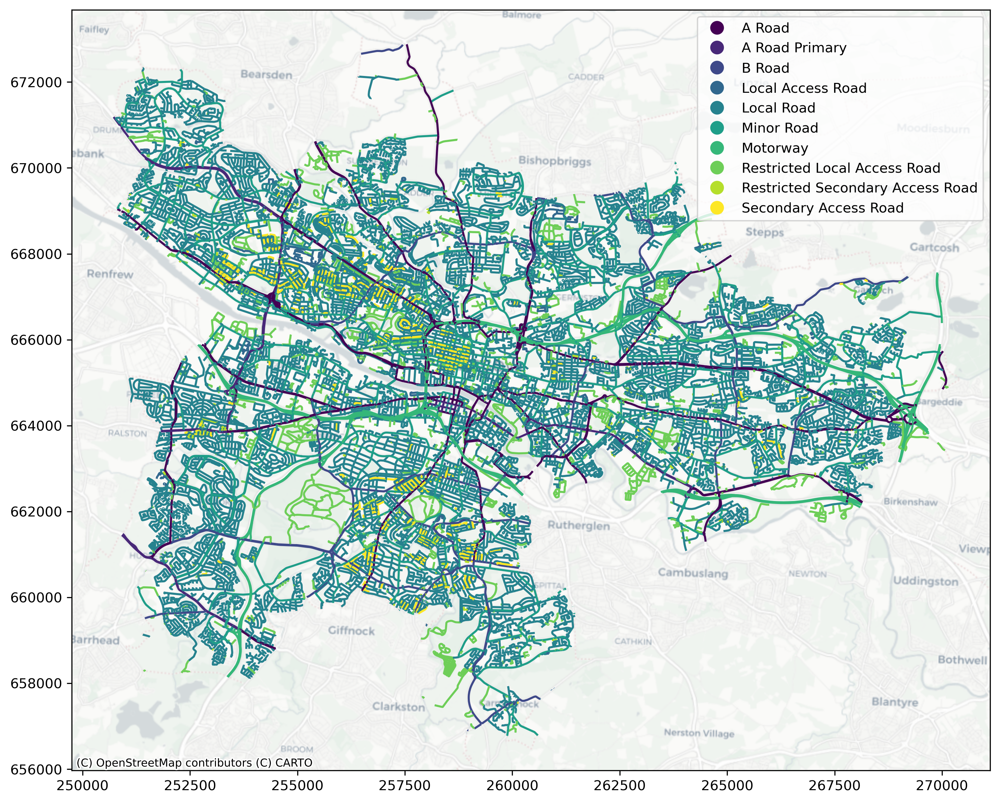

In [45]:
fig, ax = plt.subplots(figsize=(12,24), dpi=300) 
#Plot the data
road.plot(column='routeHiera', cmap='viridis', legend=True, ax=ax)
#Add basemap
ctx.add_basemap(ax, crs="EPSG:27700", source=ctx.providers.CartoDB.Positron)

In [6]:
# Step 1: Create the contingency table
data = {'Pass': [30, 20, 10],
        'Fail': [10, 20, 30]}
index = ['Low', 'Medium', 'High']
contingency_table = pd.DataFrame(data, index=index)

print("Contingency Table:")
contingency_table

Contingency Table:


,Pass,Fail
Low,30,10
Medium,20,20
High,10,30


In [7]:
# Step 2: Perform Chi-Square Test of Independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)

print("\nExpected Frequencies:")
pd.DataFrame(expected, index=index, columns=contingency_table.columns)


Chi-Square Statistic: 20.0
p-value: 4.539992976248486e-05
Degrees of Freedom: 2

Expected Frequencies:


,Pass,Fail
Low,20.0,20.0
Medium,20.0,20.0
High,20.0,20.0


In [5]:
# Step 3: Make a Decision
alpha = 0.05
if p < alpha:
    print("\nReject the null hypothesis. There is an association between study hours and exam performance.")
else:
    print("\nFail to reject the null hypothesis. No association found between study hours and exam performance.")



Reject the null hypothesis. There is an association between study hours and exam performance.
